Traditional approach


In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import imutils
from scipy import stats



In [ ]:
# Wrap Method


def order_points(pts):
	# initialzie a list of coordinates that will be ordered
	# such that the first entry in the list is the top-left,
	# the second entry is the top-right, the third is the
	# bottom-right, and the fourth is the bottom-left
	rect = np.zeros((4, 2), dtype = "float32")
	# the top-left point will have the smallest sum, whereas
	# the bottom-right point will have the largest sum
	s = pts.sum(axis = 1)
	rect[0] = pts[np.argmin(s)]
	rect[2] = pts[np.argmax(s)]
	# now, compute the difference between the points, the
	# top-right point will have the smallest difference,
	# whereas the bottom-left will have the largest difference
	diff = np.diff(pts, axis = 1)
	rect[1] = pts[np.argmin(diff)]
	rect[3] = pts[np.argmax(diff)]
	# return the ordered coordinates
	return rect


def four_point_transform(image, pts):
	# obtain a consistent order of the points and unpack them
	# individually
	rect = order_points(pts)
	(tl, tr, br, bl) = rect
	# compute the width of the new image, which will be the
	# maximum distance between bottom-right and bottom-left
	# x-coordiates or the top-right and top-left x-coordinates
	widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
	widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
	maxWidth = max(int(widthA), int(widthB))
	# compute the height of the new image, which will be the
	# maximum distance between the top-right and bottom-right
	# y-coordinates or the top-left and bottom-left y-coordinates
	heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
	heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
	maxHeight = max(int(heightA), int(heightB))
	# now that we have the dimensions of the new image, construct
	# the set of destination points to obtain a "birds eye view",
	# (i.e. top-down view) of the image, again specifying points
	# in the top-left, top-right, bottom-right, and bottom-left
	# order
	dst = np.array([
		[0, 0],
		[maxWidth - 1, 0],
		[maxWidth - 1, maxHeight - 1],
		[0, maxHeight - 1]], dtype = "float32")
	# compute the perspective transform matrix and then apply it
	M = cv2.getPerspectiveTransform(rect, dst)
	warped = cv2.warpPerspective(image, M, (maxWidth, maxHeight))
	# return the warped image
	return warped




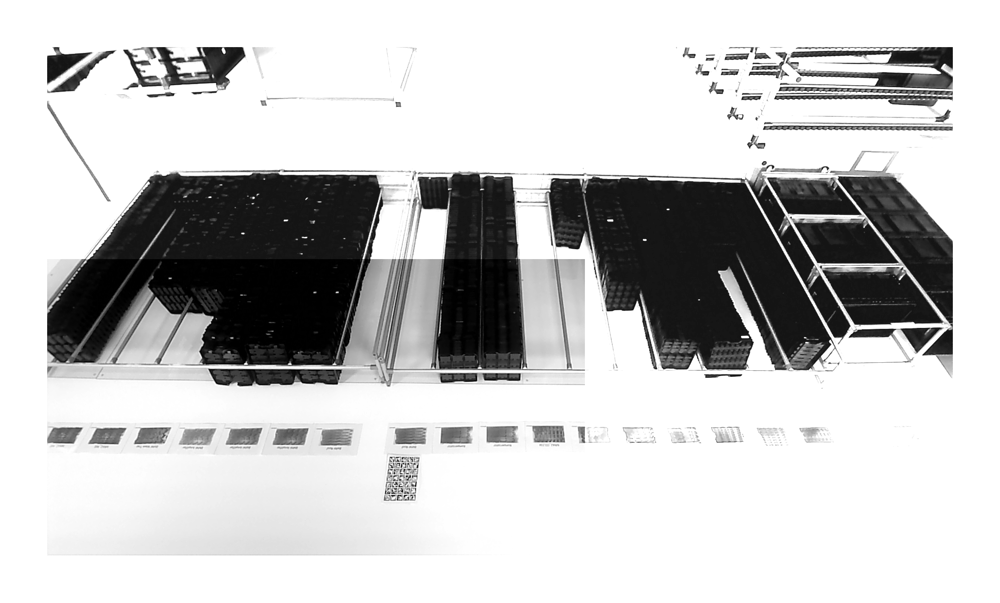

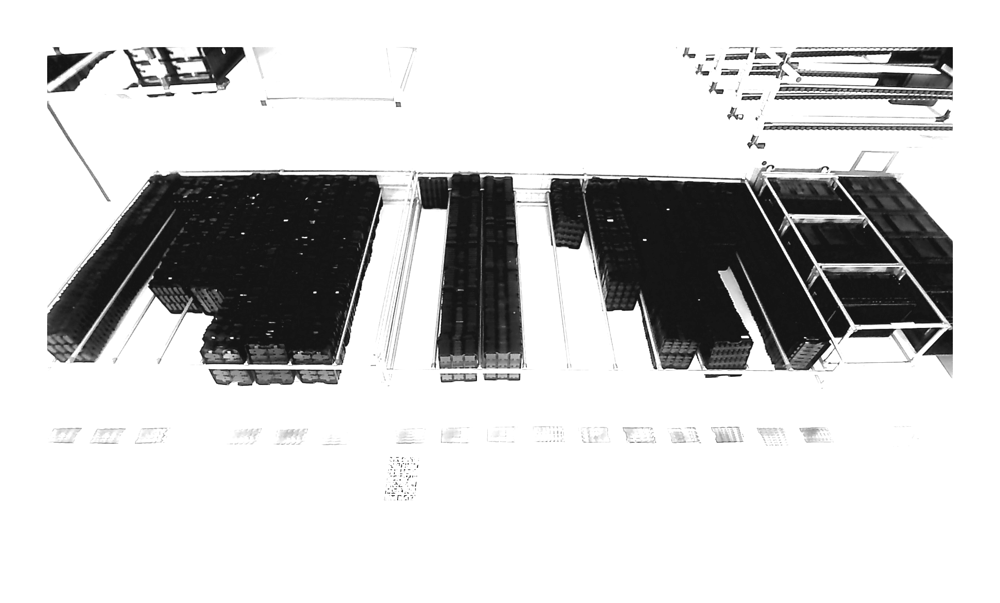

In [ ]:

# Read the original image
img = cv2.imread('/content/02_12_2022_10_20_33.png')

# Resize
scale_percent = 100 # percent of original size
width = int(img.shape[1] * scale_percent / 100)
height = int(img.shape[0] * scale_percent / 100)
dim = (width, height)

original= np.copy(img)

# ==== ADD BORDER ====
white = [255,255,255]
img= cv2.copyMakeBorder(img,100,100,100,100,cv2.BORDER_CONSTANT,value=white)
original = cv2.copyMakeBorder(original,100,100,100,100,cv2.BORDER_CONSTANT,value=white)

# Convert to Gray
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


alpha = 2 # Contrast control (1.0-3.0)
beta = 20 # Brightness control (0-100)

adjusted = cv2.convertScaleAbs(img, alpha=alpha, beta=beta)

#ROI_for_brightness = img[:,int(img.shape[0]/2+600):]

img[:,int(img.shape[0]/2+600):] = adjusted[:,int(img.shape[0]/2+600):] # Brighten right side
img[:550,:] = adjusted[:550,:]
cv2_imshow(img)
cv2_imshow(adjusted)


In [ ]:

# Scale Image

# #original = np.copy(img)

# print('Original Dimensions : ',img.shape)

# scale_percent = 100 # percent of original size
# width = int(img.shape[1] * scale_percent / 100)
# height = int(img.shape[0] * scale_percent / 100)
# dim = (width, height)

# # resize image
# img = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
# print('Resized Dimensions : ',img.shape)

# # Display original image

# img = cv2.rotate(img, cv2.ROTATE_180)

# # Expand
# white = [255,255,255]
# img= cv2.copyMakeBorder(img,60,60,60,60,cv2.BORDER_CONSTANT,value=white)

# cv2_imshow(img)

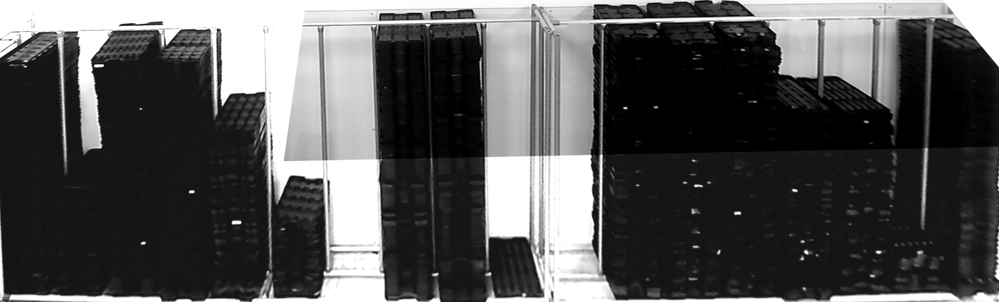

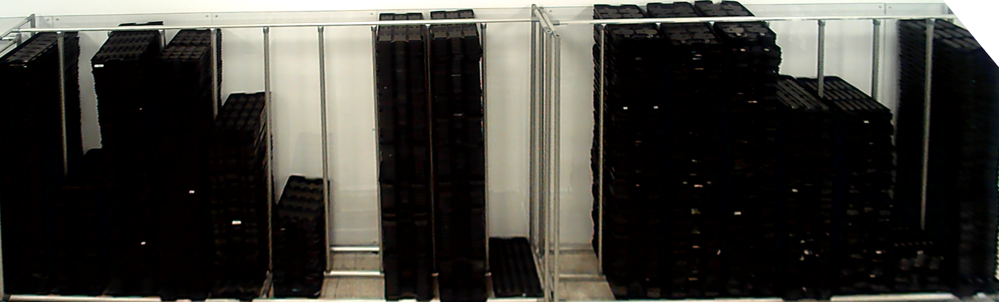

In [ ]:
WARP = True
if WARP == True:

  points = [(4, 804),
(332, 363),
(1821, 858),
(1580, 380)]

  pts = np.array(points, dtype = "float32")
  # apply the four point tranform to obtain a "birds eye view" of
  # the image
  warped = four_point_transform(img, pts)
  warped_original = four_point_transform(original, pts)

  img = warped
  img = cv2.rotate(img, cv2.ROTATE_180)


  original = cv2.rotate(warped_original, cv2.ROTATE_180)

  cv2_imshow(img)
  cv2_imshow(original)

In [ ]:
CROP = False
if CROP ==True:


  # ====CROP THE IMAGE =====

  # Define Points to Crop -- From crop_ROI.py script in MDS Gitlab
  (x_start, y_start), (x_end, y_end) = (97,288) , (1283,763)
  refPoint = [(x_start, y_start), (x_end, y_end)]
  roi = img[refPoint[0][1]:refPoint[1][1], refPoint[0][0]:refPoint[1][0]]

  rows = roi.shape[0]
  cols = roi.shape[1]

  img_center = (cols / 2, rows / 2)
  M = cv2.getRotationMatrix2D(img_center, 2.5, 1)

  rotated_image = cv2.warpAffine(roi, M, (cols, rows), borderValue=(255,255,255))


  #img = imutils.rotate(roi, 2.5)

  img = rotated_image
  print('rotated image')
  cv2_imshow(rotated_image)

Binarize the image

binarized


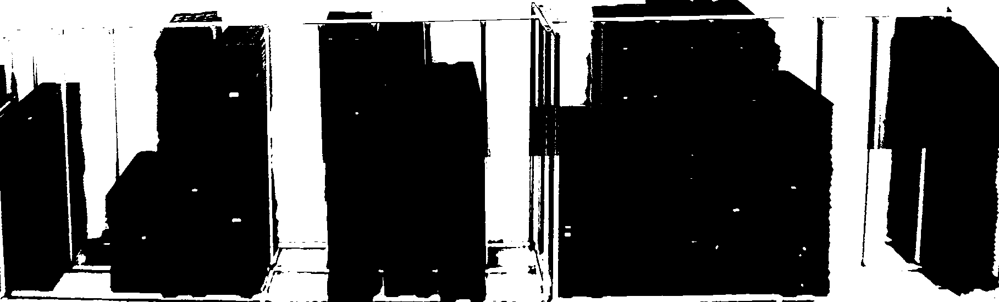

In [ ]:
#binarized = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,15,6)
#ret,binarized = cv2.threshold(img,75,255,cv2.THRESH_BINARY)

threshold,binarized = cv2.threshold(img,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)


print('binarized')
cv2_imshow(binarized)

In [ ]:
binarized = cv2.bitwise_not(binarized)


Pre processing morphological operations

preprocessed


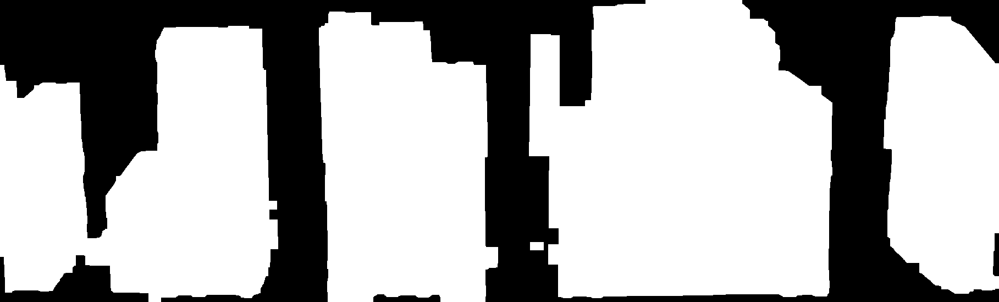

In [ ]:
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
opening = cv2.morphologyEx(binarized, cv2.MORPH_OPEN, kernel,iterations=4)

# define the kernel
kernel = np.ones((5, 5), np.uint8)
#kernel = np.array([1,1,1,1,1,1]).transpose()

# opening the image
closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel, iterations=3)
opening = cv2.morphologyEx(closing, cv2.MORPH_OPEN, kernel,iterations=3)


print('preprocessed')
cv2_imshow(opening)

Sobel X


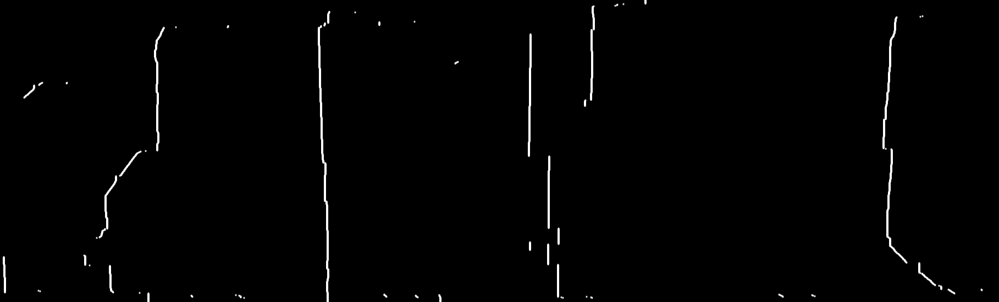

Sobel Y


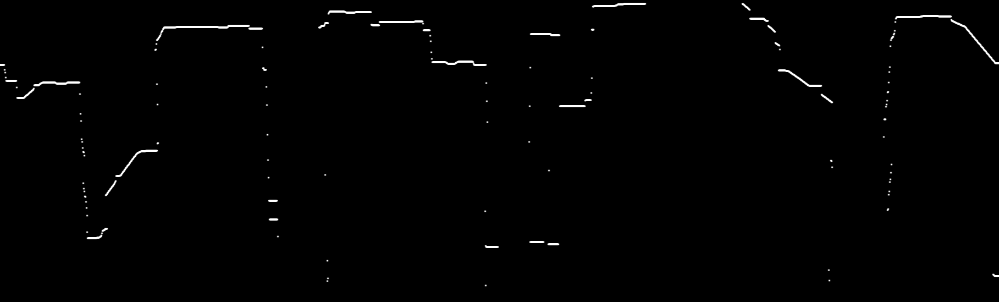

Sobel X Y using Sobel() function


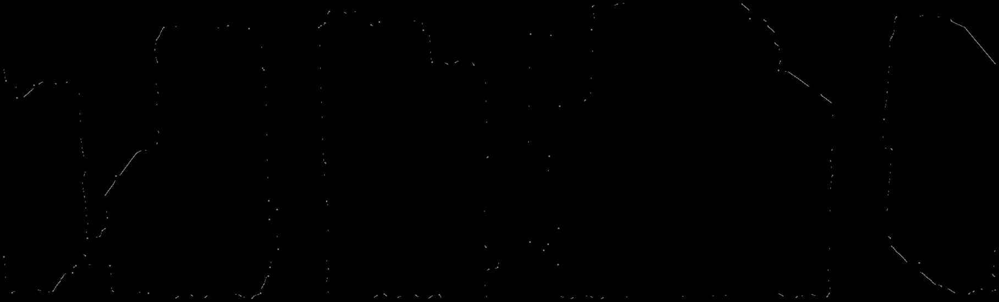

Canny


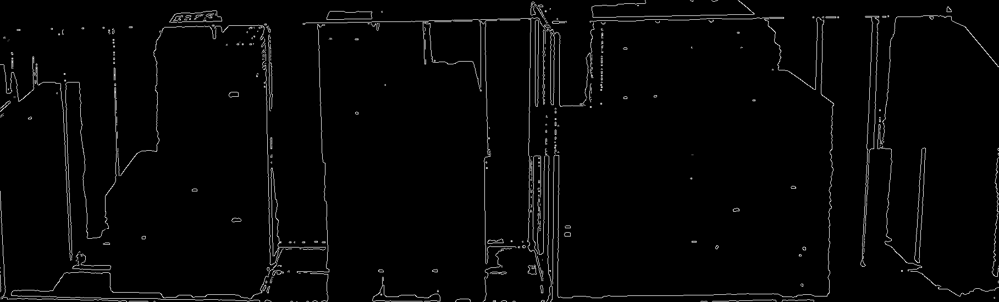

In [ ]:
# Convert to graycsale
#img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# Blur the image for better edge detection
img_blur = cv2.GaussianBlur(opening, (3,3), 0)

# Sobel Edge Detection
sobelx = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=3) # Sobel Edge Detection on the X axis
sobely = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=3) # Sobel Edge Detection on the Y axis
sobely = cv2.Sobel(img_blur, cv2.CV_16S, 0, 1, ksize=3, borderType=cv2.BORDER_DEFAULT)

sobelxy = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=1, ksize=3) # Combined X and Y Sobel Edge Detection
# Display Sobel Edge Detection Images
print('Sobel X')
cv2_imshow(sobelx)
print('Sobel Y')
cv2_imshow(sobely)

print('Sobel X Y using Sobel() function')
cv2_imshow(sobelxy)

# Canny Edge Detection
edges = cv2.Canny(image=binarized, threshold1=100, threshold2=200) # Canny Edge Detection
# Display Canny Edge Detection Image
print('Canny')
cv2_imshow(edges)


Finding countorns

In [ ]:
# For plotting

# resize image
#original = cv2.resize(original, dim, interpolation = cv2.INTER_AREA)

Using Processed Binarized


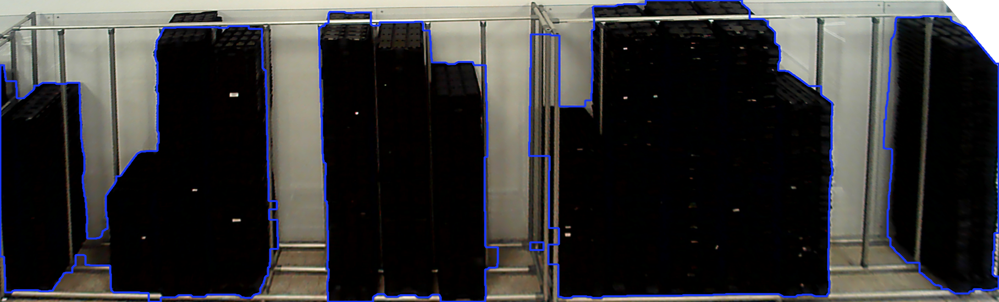

Using Original Binarized


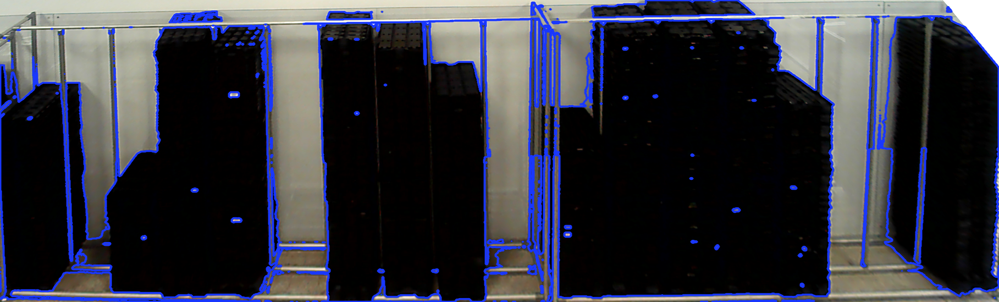

In [ ]:
# detect the contours on the binary image using cv2.CHAIN_APPROX_NONE
contours, hierarchy = cv2.findContours(image=opening, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)

# draw contours on the original image
image_copy = original.copy()
cv2.drawContours(image=image_copy, contours=contours, contourIdx=-1, color=(255, 55, 25), thickness=2, lineType=cv2.LINE_AA)

# see the results
print('Using Processed Binarized')
cv2_imshow(image_copy)


# ====== with bin
contours, hierarchy = cv2.findContours(image=binarized, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)


# draw contours on the original image
image_copy = original.copy()
cv2.drawContours(image=image_copy, contours=contours, contourIdx=-1, color=(255, 55, 25), thickness=2, lineType=cv2.LINE_AA)

# see the results
print('Using Original Binarized')
cv2_imshow(image_copy)



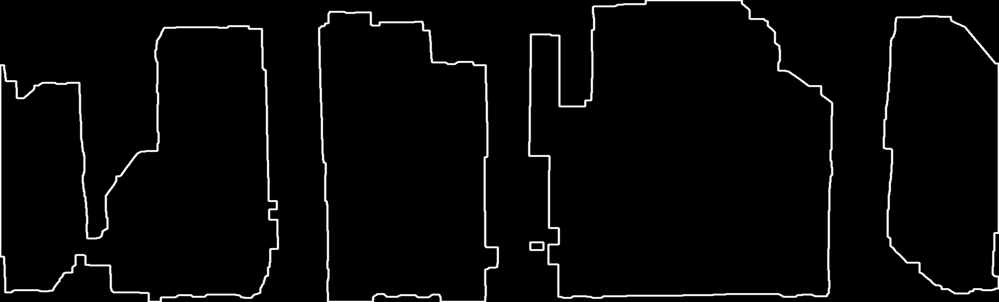

In [ ]:
# detect the contours on the binary image using cv2.CHAIN_APPROX_NONE
contours, hierarchy = cv2.findContours(image=opening, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)

# draw contours on the original image
image_copy = original.copy()
mask = np.zeros(img.shape, np.uint8)

cv2.drawContours(image=mask, contours=contours, contourIdx=-1, color=(255, 55, 25), thickness=2, lineType=cv2.LINE_AA)
cv2_imshow(mask)


dilated canny


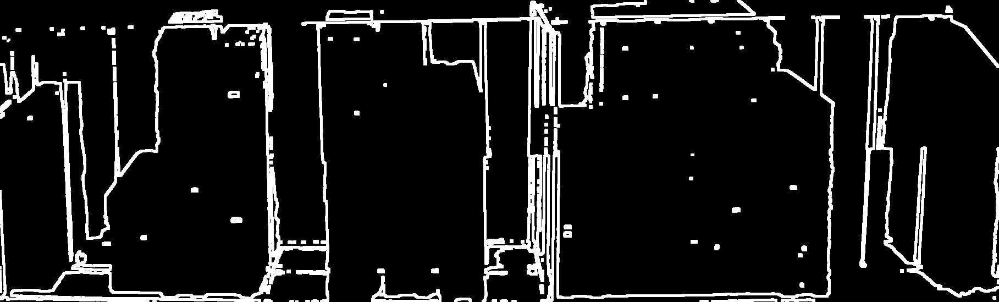

bottom canny


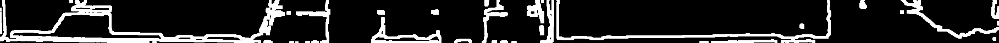

In [ ]:
# Clean up Canny

kernel = np.ones((3, 3), np.uint8)
dilation_edges = cv2.dilate(edges, kernel, iterations=2)
print('dilated canny')
cv2_imshow(dilation_edges)

print('bottom canny')
cv2_imshow(dilation_edges[470:,:])

# Soble Approach *Clean* up Sobel

preprocessed


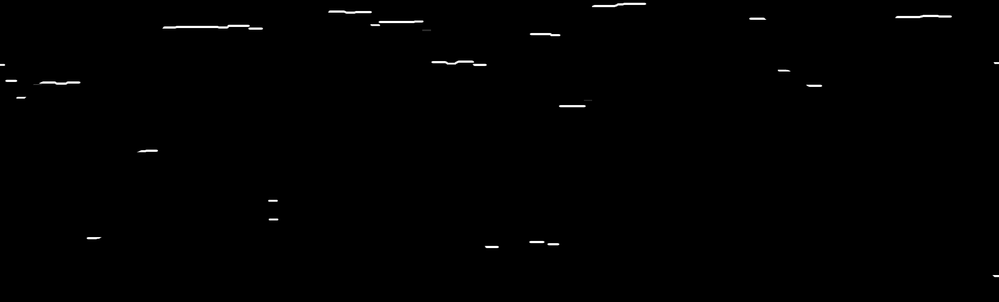

with dilation


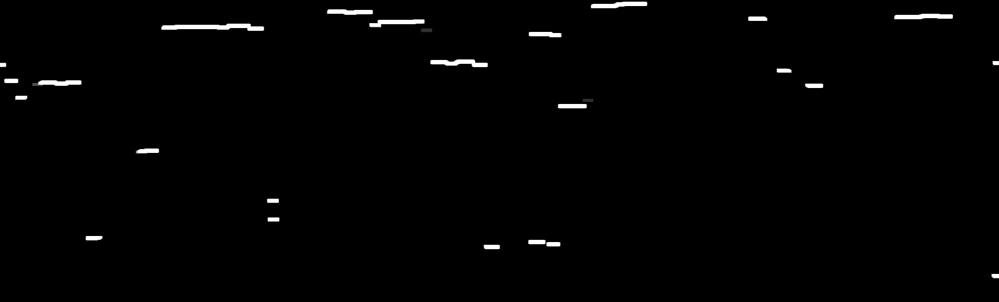

In [ ]:
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (15,1))
opening_sobel = cv2.morphologyEx(sobely, cv2.MORPH_OPEN, kernel,iterations=1)

# define the kernel
kernel = np.ones((3, 3), np.uint8)
#kernel = np.array([1,1,1,1,1,1]).transpose()

# dilate the image
dilation = cv2.dilate(opening_sobel, kernel, iterations=2)

# opening the image
#closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel, iterations=2)
#opening = cv2.morphologyEx(closing, cv2.MORPH_OPEN, kernel,iterations=2)


print('preprocessed')
cv2_imshow(opening_sobel)

print('with dilation')
cv2_imshow(dilation)


In [ ]:
dilation.shape

(549, 1817)

In [ ]:
stacked_img = np.stack((dilation,)*3, axis=-1) # Create RGB Mask
stacked_img[:,:,0] = 0 # Leave only Red
stacked_img[:,:,1] = 0 # Leave only Red


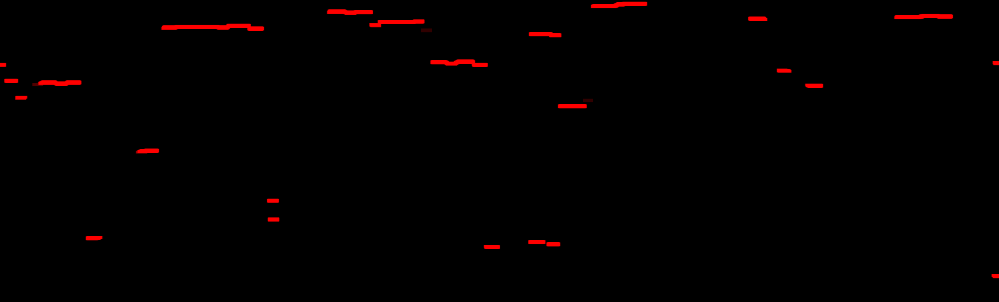

In [ ]:
cv2_imshow(stacked_img)

In [ ]:
projected = np.copy(original)

In [ ]:
#Red_mask[Red_mask>250].sum()

In [ ]:

Red_mask = stacked_img
projected[Red_mask > 200 ] = 255

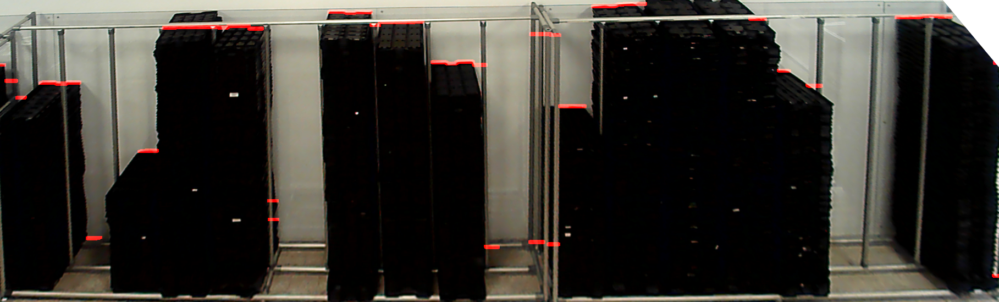

In [ ]:
cv2_imshow(projected)

## FindContourns approach

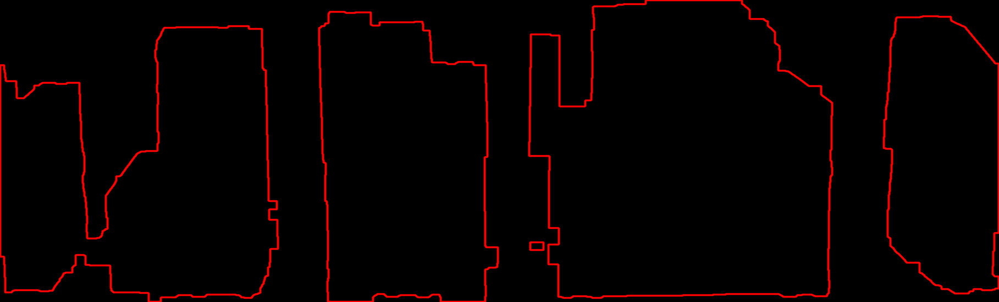

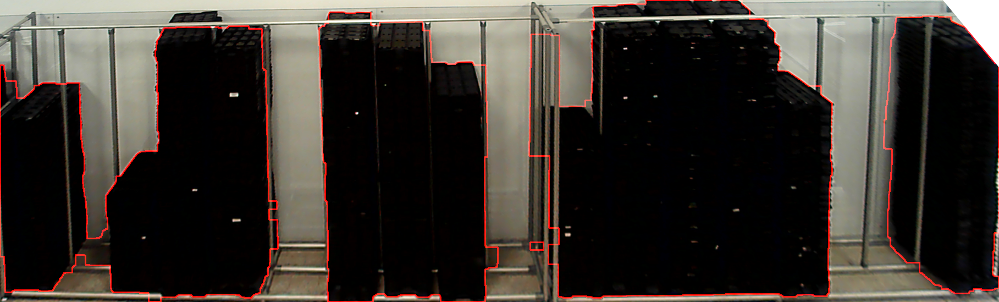

In [ ]:
# detect the contours on the binary image using cv2.CHAIN_APPROX_NONE
contours, hierarchy = cv2.findContours(image=opening, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)

# draw contours on the original image
image_copy = original.copy()
mask = np.zeros(img.shape, np.uint8)

cv2.drawContours(image=mask, contours=contours, contourIdx=-1, color=(255, 55, 25), thickness=2, lineType=cv2.LINE_AA)

stacked_img = np.stack((mask,)*3, axis=-1) # Create RGB Mask
stacked_img[:,:,0] = 0 # Leave only Red
stacked_img[:,:,1] = 0 # Leave only Red

cv2_imshow(stacked_img)
projected = np.copy(original)

Red_mask = stacked_img
projected[Red_mask > 200 ] = 255

cv2_imshow(projected)

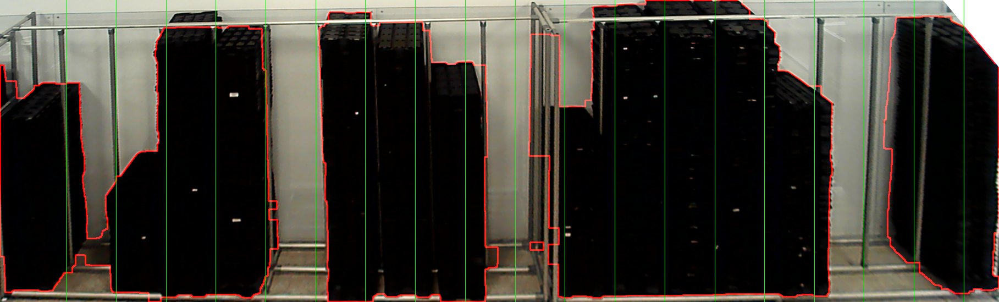

In [ ]:
def draw_grid(img, grid_shape, color=(0, 255, 0), thickness=1,x_lines = None):
    h, w, _ = img.shape
    rows, cols = grid_shape
    dy, dx = h / rows, w / cols

    a = []
    b = []
    # draw vertical lines

    if x_lines:
      for x in x_lines:
        x = int(round(x))
        cv2.line(img, (x, 0), (x, h), color=color, thickness=thickness)

    else:
      for x in np.linspace(start=dx, stop=w-dx, num=cols-1):
          x = int(round(round(x)-np.exp(x*0.0007)))  +30 # WARNING ; HARDCODED THRESHOLD FOR THIS IMAGE
          a.append(x)
          cv2.line(img, (x, 0), (x, h), color=color, thickness=thickness)

    # draw horizontal lines
    for y in np.linspace(start=dy, stop=h-dy, num=rows-1):
        y = int(round(y))
        b.append(y)
        cv2.line(img, (0, y), (w, y), color=color, thickness=thickness)

    return img, a , b


grid,x_lines,y_lines = draw_grid(projected,(1,20),x_lines =None)
x_lines = [0] + x_lines
cv2_imshow(grid)

In [ ]:
#x_lines_new = [x-np.exp(x*0.0055) for x in x_lines]

<ipython-input-23-eb6bf2605116>:25: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode_height = stats.mode(white_idx[:,0])[0][0]   # Calcualte the mode


Filling Station #  1  Height:  71 %
Filling Station #  2  Height:  0 %
Filling Station #  3  Height:  47 %
Filling Station #  4  Height:  91 %
Filling Station #  5  Height:  91 %
Filling Station #  6  Height:  0 %
Filling Station #  7  Height:  96 %
Filling Station #  8  Height:  92 %
Filling Station #  9  Height:  78 %
Filling Station #  10  Height:  0 %
Filling Station #  11  Height:  0 %
Filling Station #  12  Height:  98 %
Filling Station #  13  Height:  98 %
Filling Station #  14  Height:  100 %
Filling Station #  15  Height:  100 %
Filling Station #  16  Height:  75 %
Filling Station #  17  Height:  0 %
Filling Station #  18  Height:  0 %
Filling Station #  19  Height:  94 %


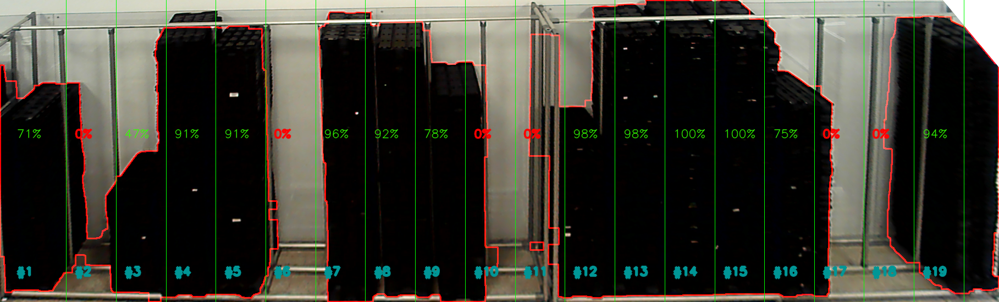

In [ ]:
from scipy import stats

height_list = []
grid_with_text = np.copy(grid)
thresh = 30

for i in range(len(x_lines)-1): # For each Filling Station ROI

  x_start, x_finish = int(round(x_lines[i])), int(round(x_lines[i+1]))
  fs_roi = Red_mask[:,x_start:x_finish,:] # Extract filling station

  # FOR THE CONTOURN APROACH
  bottom_region = fs_roi[-50:,:] # CUT OFF THE COUNTORNS
  bottom_white_idx = np.argwhere(bottom_region!=0) # get indices to extract the height
  num_of_colored_pixels = len(np.unique(bottom_white_idx[:,1]))

  empty = num_of_colored_pixels < bottom_region.shape[1]*0.5 #Check if empty
  fs_roi = fs_roi[:-30,:] # CUT OFF THE COUNTORNS

  # Calculate heights
  white_idx = np.argwhere(fs_roi!=0) # get indices to extract the height
  heights = white_idx[:,0] # Get the heights from the indices

  if empty == False:
    mode_height = stats.mode(white_idx[:,0])[0][0]   # Calcualte the mode

  else:
    mode_height = fs_roi.shape[0]
  height = round(100*(fs_roi.shape[0] - mode_height)/fs_roi.shape[0]) # OpenCV counts y from top down
  height_list.append(height)



  # Plot Levels

  # font
  font = cv2.FONT_HERSHEY_SIMPLEX
  # org
  org = (int(round(x_start +(x_finish-x_start)/2))-30,250)
  position_number = (int(round(x_start +(x_finish-x_start)/2))-30,500) #X,Y
  # fontScale
  fontScale = 0.7
  # Blue color in BGR
  if height > thresh:
    color = (0, 255, 50)
    thickness = 1
  else:
    color = (0,0,255)
    thickness = 2


  # Line thickness of 2 px

  # Using cv2.putText() method
  grid_with_text = cv2.putText(grid_with_text, str(height)+"%", org, font,
                  fontScale, color, thickness, cv2.LINE_AA)

  # Add Number of FS
  grid_with_text = cv2.putText(grid_with_text, str("#"+str(i+1)), position_number, font,
                  fontScale, (150,150,0), 3, cv2.LINE_AA)


  print('Filling Station # ',i+1, ' Height: ',height ,"%")
  #m = stats.mode(fs_roi)
  #print(m[0])
  #cv2_imshow(fs_roi)

cv2_imshow(grid_with_text)




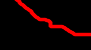

(50, 91, 3)
empty:  False
bottom_red_pixels 77
bottom_X_size 91


In [ ]:
cv2_imshow(bottom_region)

bottom_white_idx = np.argwhere(bottom_region!=0) # get indices to extract the height
num_of_colored_pixels = len(np.unique(bottom_white_idx[:,1]))

empty = num_of_colored_pixels < bottom_region.shape[1]*0.5 #Check if empty
print(bottom_region.shape)
print('empty: ', empty)
print('bottom_red_pixels',num_of_colored_pixels)
print('bottom_X_size',bottom_region.shape[1])

In [ ]:
np.unique(bottom_white_idx[:,1])

array([14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30,
       31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47,
       48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64,
       65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81,
       82, 83, 84, 85, 86, 87, 88, 89, 90])

## FULL PIPELINE

In [ ]:


def order_points(pts):
	# initialzie a list of coordinates that will be ordered
	# such that the first entry in the list is the top-left,
	# the second entry is the top-right, the third is the
	# bottom-right, and the fourth is the bottom-left
	rect = np.zeros((4, 2), dtype = "float32")
	# the top-left point will have the smallest sum, whereas
	# the bottom-right point will have the largest sum
	s = pts.sum(axis = 1)
	rect[0] = pts[np.argmin(s)]
	rect[2] = pts[np.argmax(s)]
	# now, compute the difference between the points, the
	# top-right point will have the smallest difference,
	# whereas the bottom-left will have the largest difference
	diff = np.diff(pts, axis = 1)
	rect[1] = pts[np.argmin(diff)]
	rect[3] = pts[np.argmax(diff)]
	# return the ordered coordinates
	return rect


def four_point_transform(image, pts):
	# obtain a consistent order of the points and unpack them
	# individually
	rect = order_points(pts)
	(tl, tr, br, bl) = rect
	# compute the width of the new image, which will be the
	# maximum distance between bottom-right and bottom-left
	# x-coordiates or the top-right and top-left x-coordinates
	widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
	widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
	maxWidth = max(int(widthA), int(widthB))
	# compute the height of the new image, which will be the
	# maximum distance between the top-right and bottom-right
	# y-coordinates or the top-left and bottom-left y-coordinates
	heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
	heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
	maxHeight = max(int(heightA), int(heightB))
	# now that we have the dimensions of the new image, construct
	# the set of destination points to obtain a "birds eye view",
	# (i.e. top-down view) of the image, again specifying points
	# in the top-left, top-right, bottom-right, and bottom-left
	# order
	dst = np.array([
		[0, 0],
		[maxWidth - 1, 0],
		[maxWidth - 1, maxHeight - 1],
		[0, maxHeight - 1]], dtype = "float32")
	# compute the perspective transform matrix and then apply it
	M = cv2.getPerspectiveTransform(rect, dst)
	warped = cv2.warpPerspective(image, M, (maxWidth, maxHeight))
	# return the warped image
	return warped


In [ ]:
def draw_grid(img, grid_shape, color=(0, 255, 0), thickness=1,x_lines = None):
    h, w, _ = img.shape
    rows, cols = grid_shape
    dy, dx = h / rows, w / cols

    a = []
    b = []
    # draw vertical lines

    if x_lines:
      for x in x_lines:
        x = int(round(x))
        a.append(x)
        cv2.line(img, (x, 0), (x, h), color=color, thickness=thickness)

    else:
      for x in np.linspace(start=dx, stop=w-dx, num=cols-1):
          x = int(round(round(x)-np.exp(x*0.0007)))  +30 # WARNING ; HARDCODED THRESHOLD FOR THIS IMAGE
          a.append(x)
          #print('a: ',a)
          cv2.line(img, (x, 0), (x, h), color=color, thickness=thickness)

    # draw horizontal lines
    for y in np.linspace(start=dy, stop=h-dy, num=rows-1):
        y = int(round(y))
        b.append(y)
        cv2.line(img, (0, y), (w, y), color=color, thickness=thickness)

    return img, a , b


In [ ]:
def print_filling_level(img,thresh,original,projected=False,):

  # ========= PREPARE IMAGE SHAPE ===============================
  # Scale
  if projected == False:
    projected = np.copy(img) # For later plot

  else:
    projected = np.copy(original)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

  scale_percent = 100 # percent of original size
  width = int(img.shape[1] * scale_percent / 100)
  height = int(img.shape[0] * scale_percent / 100)
  dim = (width, height)

  # resize image
  img = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
  projected = cv2.resize(projected, dim, interpolation = cv2.INTER_AREA)

  # Binarize and invert
  threshold,binarized = cv2.threshold(img,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
  binarized = cv2.bitwise_not(binarized)

  # ========= MORPHOLOGICAL OPERATIONS ================================================================
  # Get rid of small noise on image with a rectangular kernel, 3 works better then 5 in the test image
  kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
  opening = cv2.morphologyEx(binarized, cv2.MORPH_OPEN, kernel,iterations=4)

  # define the kernel for closing ( I choose a bigger one to eliminate the noise from the vertical stand)
  kernel = np.ones((5, 5), np.uint8)

  # opening and closing image with bigger kernel
  closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel, iterations=3)
  opening = cv2.morphologyEx(closing, cv2.MORPH_OPEN, kernel,iterations=3)

  img_blur = cv2.GaussianBlur(opening, (3,3), 0)

  # ===== EDGE DETECTION ==========
  # Sobel Edge Detection
  sobely = cv2.Sobel(img_blur, cv2.CV_16S, 0, 1, ksize=3, borderType=cv2.BORDER_DEFAULT) # depth focal of 16 s worked better than 32M


  # ==== SOBEL FILTER MORPHOLOGICAL CLEAN UP ===========
  SOBEL = False
  if SOBEL ==True:
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (15,1)) ## VERY BIG HORIZONTAL STRUCTURING ELEMENT TO EXTRACT
                                                              # THE FILLING LEVEL
    opening_sobel = cv2.morphologyEx(sobely, cv2.MORPH_OPEN, kernel,iterations=1)

    # define the kernel
    kernel = np.ones((3, 3), np.uint8)

    # dilate the mask
    dilation = cv2.dilate(opening_sobel, kernel, iterations=2)
    mask = dilation

  CONTOUR = True
  if CONTOUR == True:
    # detect the contours on the binary image using cv2.CHAIN_APPROX_NONE
    contours, hierarchy = cv2.findContours(image=opening, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)

    # draw contours on the mask
    mask = np.zeros(img.shape, np.uint8)
    cv2.drawContours(image=mask, contours=contours, contourIdx=-1, color=(255, 55, 25), thickness=2, lineType=cv2.LINE_AA)



  # ============ CREATING THE MASK FOR PLOTING =======================
  stacked_img = np.stack((mask,)*3, axis=-1) # Create RGB Mask (Expand Dim)
  stacked_img[:,:,0] = 0 # Leave only Red
  stacked_img[:,:,1] = 0 # Leave only Red


  # ==== PLOT MASK AND IMAGE =====
  cv2_imshow(stacked_img) # Comment if you dont want mask

  Red_mask = stacked_img
  projected[Red_mask > 200 ] = 255 # Elininate noise from mask and set thresh
  cv2_imshow(projected)


  # x_LINES FROM SCRIPT
  x_lines = [119,203,293,388,483,
             581,681,776,876,992,
             1096,1192,1293,1395,1492,
             1592,1691,1781]

  grid,x_lines,y_lines = draw_grid(projected,(1,20),x_lines =x_lines)
  x_lines = [0] + x_lines # offset
  height_list = []
  grid_with_text = np.copy(grid)


  for i in range(len(x_lines)-1):

    x_start, x_finish = int(round(x_lines[i])), int(round(x_lines[i+1]))
    #print(x_start)
    fs_roi = Red_mask[:,x_start:x_finish,:]

    # FOR THE CONTOURN APROACH
    bottom_region = fs_roi[-50:,:] # CUT OFF THE COUNTORNS
    bottom_white_idx = np.argwhere(bottom_region!=0) # get indices to extract the height
    num_of_colored_pixels = len(np.unique(bottom_white_idx[:,1]))


    empty = num_of_colored_pixels < bottom_region.shape[1]*0.5 #Check if empty
    fs_roi = fs_roi[:-30,:] # CUT OFF THE COUNTORNS
    white_idx = np.argwhere(fs_roi!=0) # get indices to extract the height
    heights = white_idx[:,0]
    if empty == False:
      mode_height = stats.mode(white_idx[:,0])[0][0]
    else:
      mode_height = fs_roi.shape[0]
    height = round(100*(fs_roi.shape[0] - mode_height)/fs_roi.shape[0]) # OpenCV counts y from top down
    height_list.append(height)



    # Plot Levels

    # font
    font = cv2.FONT_HERSHEY_SIMPLEX
    # org
    org = (int(round(x_start +(x_finish-x_start)/2))-30,250)
    position_number = (int(round(x_start +(x_finish-x_start)/2))-30,500) #X,Y

    # fontScale
    fontScale = 0.7


    # Blue color in BGR
    if height > thresh:
      color = (0, 255, 50)
      thickness = 1
    else:
      color = (0,0,255)
      thickness = 2
    # Using cv2.putText() method
    # Draw Heights
    grid_with_text = cv2.putText(grid_with_text, str(height)+"%", org, font,
                    fontScale, color, thickness, cv2.LINE_AA)

    # Draw Numbers
    grid_with_text = cv2.putText(grid_with_text, str("#"+str(i+1)), position_number, font,
                  fontScale, (150,150,0), 3, cv2.LINE_AA)



    print('Filling Station # ',i+1, ' Height: ',height ,"%")
    #m = stats.mode(fs_roi)
    #print(m[0])
    #cv2_imshow(fs_roi)

  cv2_imshow(grid_with_text)

  return height_list, grid






In [ ]:
def load_border_and_brighten(img):
  # Read the original image

  # Resize
  scale_percent = 100 # percent of original size
  width = int(img.shape[1] * scale_percent / 100)
  height = int(img.shape[0] * scale_percent / 100)
  dim = (width, height)

  original= np.copy(img)

  # ==== ADD BORDER ====
  white = [255,255,255]
  img= cv2.copyMakeBorder(img,100,100,100,100,cv2.BORDER_CONSTANT,value=white)
  original = cv2.copyMakeBorder(original,100,100,100,100,cv2.BORDER_CONSTANT,value=white)

  # Convert to Gray
  #img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


  alpha = 2 # Contrast control (1.0-3.0)
  beta = 20 # Brightness control (0-100)

  adjusted = cv2.convertScaleAbs(img, alpha=alpha, beta=beta)

  #ROI_for_brightness = img[:,int(img.shape[0]/2+600):]

  img[:,int(img.shape[0]/2+600):] = adjusted[:,int(img.shape[0]/2+600):] # Brighten right side
  img[:650,:] = adjusted[:650,:]


  return img,original

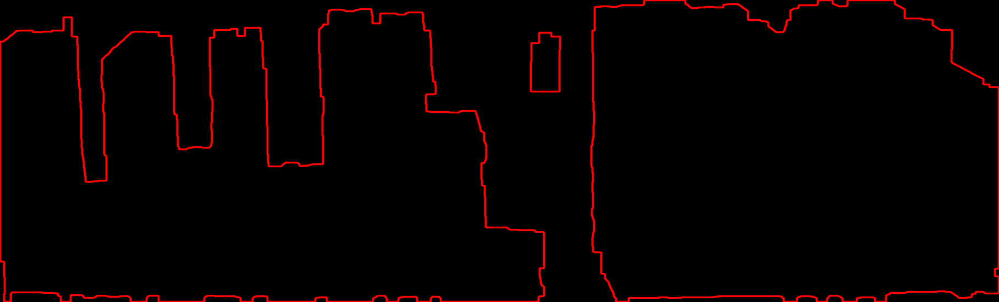

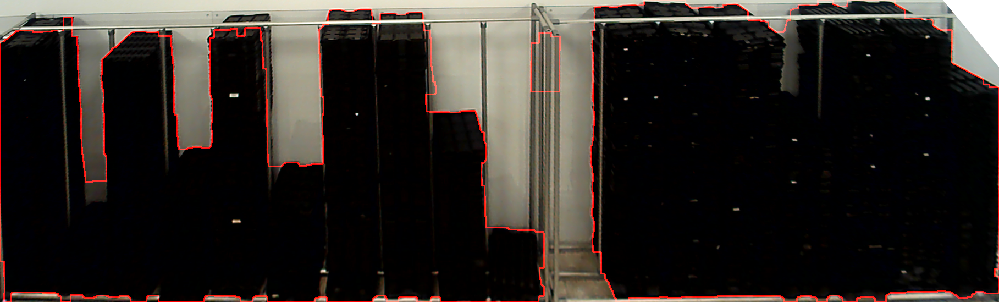

<ipython-input-4-b00103d5ee30>:112: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode_height = stats.mode(white_idx[:,0])[0][0]


Filling Station #  1  Height:  89 %
Filling Station #  2  Height:  37 %
Filling Station #  3  Height:  89 %
Filling Station #  4  Height:  48 %
Filling Station #  5  Height:  90 %
Filling Station #  6  Height:  42 %
Filling Station #  7  Height:  97 %
Filling Station #  8  Height:  95 %
Filling Station #  9  Height:  61 %
Filling Station #  10  Height:  19 %
Filling Station #  11  Height:  0 %
Filling Station #  12  Height:  98 %
Filling Station #  13  Height:  100 %
Filling Station #  14  Height:  98 %
Filling Station #  15  Height:  98 %
Filling Station #  16  Height:  100 %
Filling Station #  17  Height:  94 %
Filling Station #  18  Height:  90 %


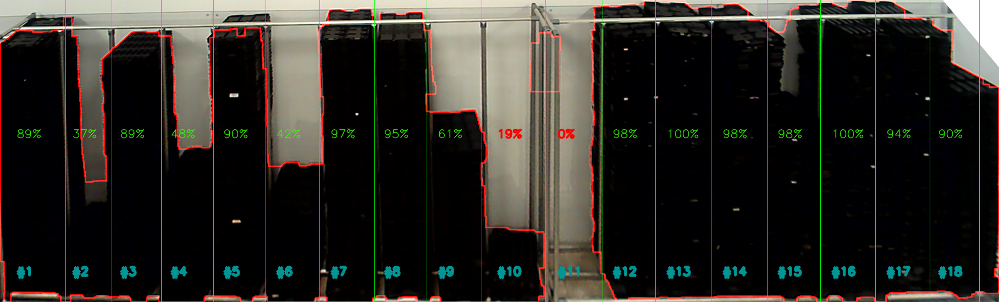

In [ ]:
img = cv2.imread('/content/29_11_2022_22_58_30.png')  # Load image

# Pre process
img,original= load_border_and_brighten(img)


points = [(4, 804),
(332, 363),
(1821, 858),
(1580, 380)]



pts = np.array(points, dtype = "float32")
# apply the four point tranform to obtain a "birds eye view" of
# the image
warped = four_point_transform(img, pts)
warped_original = four_point_transform(original, pts)
# Rotate
warped = cv2.rotate(warped, cv2.ROTATE_180)
original = cv2.rotate(warped_original, cv2.ROTATE_180)


#cv2_imshow(warped)


heights, grid = print_filling_level(warped,thresh=30,original=original,projected=True)

In [ ]:
#img = cv2.imread('test3.jpg')
#print_filling_level(img)

In [ ]:
d = {'00-01-2012':[]}
for idx, level in enumerate(heights):
        #print('Filling_station #' ,idx , ' Height: ' ,level, ' %')
        d['00-01-2012'].append(level)

In [ ]:
import pandas as pd
row_df = pd.DataFrame.from_dict(d,orient='index')
row_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
00-01-2012,71,0,47,94,91,0,96,92,78,0,62,98,100,100,70,0,0,94


In [ ]:
row_df.to_csv('test.csv',index=True,mode='a',header=True) # Create csv

In [ ]:
row_df.to_csv('test.csv',index=True,mode='a',header=False) # Create csv